# Движение заряженной частицы в электромагнитном поле.
## Для начала рассмотрим движение заряженной частицы в постоянном магнитном поле.

На частицу действует сила Лоренца, так что уравнение движения имеет вид:
$$ m \dot {\vec{v}} = \frac{q}{c} [\vec{v} \times  \vec{B}  ] $$
Выберем систему координат так, что:
$$ \vec{B} = B \cdot \vec{e_x} $$

Из первого уравнения очевидно, что:
$$ \dot{\vec{v}} \perp \vec{v},\  \    \dot{\vec{v}} \perp \vec{B}$$
$ \text{Тогда разложим }  \vec{v} \text{ на две составляющие; параллельную } \vec{B}  :  \vec{v_{\shortparallel}} \text{ и ортогональную } \vec{B} :  \vec{v_{\perp}}$$
        Тогда : $$  m\dot{\vec{v_{\shortparallel}}}= 0$
$$m\dot{\vec{v_{\perp}}} = \frac{q}{c}[\vec{v_{\perp}}\times \vec{B}]$$

Перепишем второе в виде:
$$ \dot{\vec{v_{\perp}}}=[\vec{\omega} \times \vec{v_{\perp}} ]$$ $ \text{, где } \vec{\omega} = -\frac{q\vec{B}}{mc}\text{ - циклотронная частота}$


Тогда заряженная частица в магнитном поле будет вращаться по окружности радиуса:
$$ R = \frac{v_{\perp}}{\omega}=\frac{mcv_{\perp}}{qB},$$ при этом:
$$ \vec{R} = -\frac{mc}{q} \frac{[\vec{v}\times \vec{B}]}{B^2}$$

In [1]:
# импортируем необходимые библиотеки
import numpy as np
from scipy.integrate import ode

Чтобы использовать ode (для решения дифференциальных уравнений), нам нужно определить производные скорости, которая вычисляется с помощью силы Лоренца, и положения, которое определяется скоростью

In [2]:
def newton(t, Y, q, m, B):
    """Вычисляет производную вектора состояния Y по уравнению движения:
    Y-вектор состояния (x, y, z, u, v, w) = = = (положение, скорость).
    возвращает dY/dt.
    """
    x, y, z = Y[0], Y[1], Y[2]
    u, v, w = Y[3], Y[4], Y[5]
    
    alpha = q / m * B
    return np.array([u, v, w, 0, alpha * w, -alpha * v])

In [3]:
r = ode(newton).set_integrator('dopri5')

In [4]:
# задаем начальные условия 
t0 = 0
x0 = np.array([0, 0, 0]) # координата
v0 = np.array([1, 1, 0]) # скорость
initial_conditions = np.concatenate((x0, v0)) # массив начальных условий 

In [5]:
r.set_initial_value(initial_conditions, t0).set_f_params(1.0, 1.0, 1.0) # задаем параметры системы: заряд, масса, величина магн индукции

positions = []
t1 = 50
dt = 0.05
while r.successful() and r.t < t1:
    r.integrate(r.t+dt)
    positions.append(r.y[:3]) # сохраняем только положение

positions = np.array(positions)

In [6]:
%matplotlib inline
import matplotlib.pyplot as plt

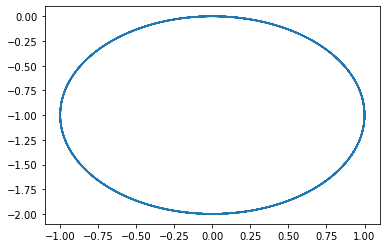

In [7]:
plt.plot(positions[:, 1], positions[:, 2])

То что и требовалось ожидать, траектория движения- окружность

In [8]:
import matplotlib as mpl

Теперь посмотрим, как это выглядит в пространстве.
Составляющая скорости, параллельная индукции магнитного поля, как уже говорилось ранее, - постоянна, поэтому частица будет двигаться по спирали.

Text(60, 0, 'B field')

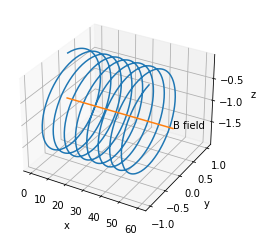

In [9]:
from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.plot3D(positions[:, 0], positions[:, 1], positions[:, 2])

B1 = np.array([x0[0], x0[1], -1])
B2 = np.array([60, 0, 0])
B_axis = np.vstack((B1, B1 + B2))
ax.plot3D(B_axis[:, 0], 
         B_axis[:, 1],
         B_axis[:, 2])
plt.xlabel('x')
plt.ylabel('y')
ax.set_zlabel('z')
ax.text3D((B1 + B2)[0], (B1 + B2)[1], (B1 + B2)[2], "B field")

Вот и наша спираль.

Теперь посмотрим, на движение частицы.

In [10]:
from tempfile import NamedTemporaryFile
import base64 
from matplotlib import animation
VIDEO_TAG = """<video controls>
 <source src="data:video/x-m4v;base64,{0}" type="video/mp4">
 Your browser does not support the video tag.
</video>"""

def anim_to_html(anim):
    if not hasattr(anim, '_encoded_video'):
        f = NamedTemporaryFile(suffix='.mp4', delete=False)
        anim.save(f.name, fps=20, extra_args=['-vcodec', 'libx264', '-pix_fmt', 'yuv420p'])
        f.flush()
        video = open(f.name, "rb").read()
        f.close()
        anim._encoded_video = base64.b64encode(video).decode('utf-8')
    
    return VIDEO_TAG.format(anim._encoded_video)

In [11]:
from IPython.display import HTML

def display_animation(anim):
    plt.close(anim._fig)
    return HTML(anim_to_html(anim))

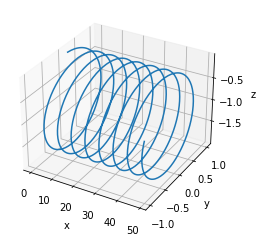

In [12]:
FRAMES = 50
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

def init():
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    ax.set_zlabel('z')
    
# реализуем анимацию
def animate(i):
    current_index = int(positions.shape[0] / FRAMES * i)
    ax.cla()
    ax.plot(positions[:current_index, 0], 
              positions[:current_index, 1], 
              positions[:current_index, 2])
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    ax.set_zlabel('z')
# вызываем функцию анимации 
anim = animation.FuncAnimation(fig, animate, init_func=init,
                               frames=FRAMES, interval=100)

# вызываем новую функцию, чтобы вывести результат
HTML(anim.to_jshtml())

# Посмотрим, что изменится, если заряд будет отрицательным.

Из теории мы знаем, что поменяется знак циклотронной частоты, а, следовательно, и направление вращения.

$$ \vec{\omega}= - \frac{q \vec{B}}{mc}$$

In [13]:
r.set_initial_value(initial_conditions, t0).set_f_params(-1.0, 1.0, 1.0)# заряд, масса, поле

positions = []
t1 = 50
dt = 0.05
while r.successful() and r.t < t1:
    r.integrate(r.t+dt)
    positions.append(r.y[:3]) # сохраняем только положение, а не скорость

positions = np.array(positions)

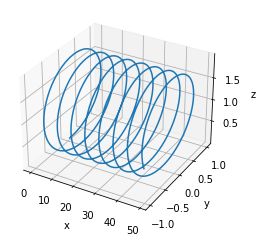

In [14]:
FRAMES = 50
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

def init():
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    ax.set_zlabel('z')
    
# реализуем анимацию
def animate(i):
    current_index = int(positions.shape[0] / FRAMES * i)
    ax.cla()
    ax.plot(positions[:current_index, 0], 
              positions[:current_index, 1], 
              positions[:current_index, 2])
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    ax.set_zlabel('z')
# вызываем функцию анимации 
anim = animation.FuncAnimation(fig, animate, init_func=init,
                               frames=FRAMES, interval=100)

# вызываем новую функцию, чтобы вывести результат
HTML(anim.to_jshtml())

Сравним эту анимацию с предыдущей и убедимся, что наши ожидания подтвердились.

## Рассмотрим, траекторию частицы в более сильном поле.

Изходя из теории, циклотронная частота должна увеличиться пропорционально полю, а также должен уменьшиться радиус вращения, тк:

$ \vec{\omega}= - \frac{q \vec{B}}{mc}$; $R=\frac{mcv_{\perp}}{qB} $

Для сравнения выведем на одной анимации тректории движения частиц, при поле отличающемся в 10 раз.

In [15]:
r.set_initial_value(initial_conditions, t0).set_f_params(1.0, 1.0, 10.0) # заряд, масса, поле

positions2 = []
t1 = 50
dt = 0.05
while r.successful() and r.t < t1:
    r.integrate(r.t+dt)
    positions2.append(r.y[:3])  # сохраняем только положение, а не скорость

positions2 = np.array(positions2)

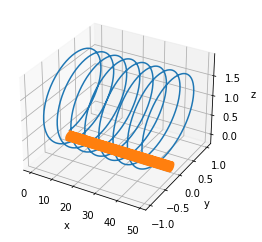

In [16]:
FRAMES = 50
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

def init():
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    ax.set_zlabel('z')
    
# реализуем анимацию
def animate(i):
    current_index = int(positions.shape[0] / FRAMES * i)
    ax.cla()
    ax.plot(positions[:current_index, 0], 
              positions[:current_index, 1], 
              positions[:current_index, 2])
    ax.plot(positions2[:current_index, 0], 
              positions2[:current_index, 1], 
              positions2[:current_index, 2])
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    ax.set_zlabel('z')
# вызываем функцию анимации 
anim = animation.FuncAnimation(fig, animate, init_func=init,
                               frames=FRAMES, interval=100)

# вызываем новую функцию, чтобы вывести результат
HTML(anim.to_jshtml())

Новый график - оранжевый. Видим, что радиус сильно меньше, а частица вращается чаще. Что подтверждает нашу гипотезу.

# Переходим к самому интересному - движению заряженных частиц в электомагнитном поле.
## Для начала, рассмотрим движение заряженной частицы в постоянном электромагнитном поле:
$$ \vec{B}=B \vec{e_x}\ ; \ \vec{E}=E \vec{e_y} $$

Как и выше, выделяем компоненты скорости, параллельную и перпендикулярную вектору магнитного поля: 
$ \vec{v}= \vec{v_{\perp}} + \vec{v_{\shortparallel}} $, тогда:
$$ m \dot{\vec{v_{\shortparallel}}}=0$$
$$ m \dot{\vec{v_{\perp}}}= q \left( \vec{E}+\frac{1}{c}[\vec{v_{\perp}}\times \vec{B}]  \right) $$
Из первого уравнения получаем $\vec{v_{\shortparallel}}= const$, что означает, что частица будет двигаться вдоль вектора $\vec{B}$ с постоянной скоростью, определяемой начальными условиями.

Для нахождения компоненты $\vec{v_{\perp}}$ положим $\vec{v_{\perp}}=\vec{u} + \vec{v}'$ и подберём вектор $\vec{u}$ так, чтобы исключить электрическое поле:
$$\vec{E}+\frac{1}{c}[\vec{u}\times \vec{B}]=0 $$

В этом уравнении можно считать $\vec{u}\perp \vec{B} \Rightarrow (\vec{u}\cdot \vec{B})=0$.Для нахождения вектора $\vec{u}$ умножим почленно это уравнение векторно слева на $\vec{B}$. Тогда получим:
$$[\vec{B}\times \vec{E}]+\frac{1}{c}[\vec{B}\times [\vec{u}\times \vec{B}]]=0  $$
Преобразуем двойное векторное произведение с учётом взаимной ортогональности векторов $\vec{B}$ и $\vec{u}$:
$$ [\vec{B}\times[\vec{u}\times \vec{B}]]=\vec{u}B^2-\vec{B}(\vec{u}\cdot \vec{B})= \vec{u}B^2 $$
Итого имеем: $$\vec{u}= c \frac{[\vec{E}\times \vec{B}]}{B^2}.$$

Таким образом, это движение заряженной частицы в таком электромагнитном поле представляет собой дрейф в направлении, перпендикулярном обоим полям.

Для компоненты $\vec{v}'$ получаем уравнение:
$$ m \dot{\vec{v}'}=\frac{q}{c}[\vec{v}'\times \vec{B}] ,$$ которое описывает вращательное движение с угловой скоростью:
$\vec{\omega}=-\frac{q\vec{B}}{mc} $ вокруг направления магнитного поля.

Тогда суммарное движение представляет наложение:                                           
1) Равномерного движения вдоль вектора $\vec{B}$ с постоянной скоростью $\left( \vec{v_{\shortparallel}} \right)_0$, равной компоненте скорости $\vec{v_{\shortparallel}}$ в начальный момент. <br>                                                                        2) Дрейфового движения со скоростью $\vec{u}= c \frac{[\vec{E}\times \vec{B}]}{B^2}$.<br>        3) Вращения вокруг направления $\vec{B}$ с угловой скоростью $\vec{\omega}=-\frac{q\vec{B}}{mc} $.

Для корректной работы нам нужно изменить наши интеграторы из предыдущих разделов:

In [17]:
def newton(t, Y, q, m, B, E):
    """Вычисляет производную вектора состояния Y по уравнению движения:
    Y-вектор состояния (x, y, z, u, v, w) = = = (положение, скорость).
    возвращает dY/dt.
    """
    x, y, z = Y[0], Y[1], Y[2]
    u, v, w = Y[3], Y[4], Y[5]
    
    alpha = q / m 
    return np.array([u, v, w, 0, alpha * B* w + E, -alpha * B * v])

In [18]:
r = ode(newton).set_integrator('dopri5')

In [19]:
r.set_initial_value(initial_conditions, t0).set_f_params(1.0, 1.0, 1.0, 0.5) # заряд, масса, B, E 
positions = []
t1 = 50
dt = 0.05
while r.successful() and r.t < t1:
    r.integrate(r.t+dt)
    positions.append(r.y[:3])

positions = np.array(positions)

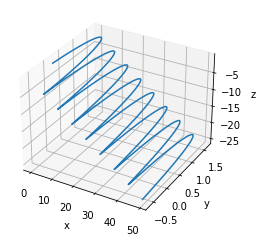

In [20]:
FRAMES = 50
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

def init():
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    ax.set_zlabel('z')
    
# реализуем анимацию
def animate(i):
    current_index = 20 * i
    ax.cla()
    ax.plot(positions[:current_index, 0], 
              positions[:current_index, 1], 
              positions[:current_index, 2])
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    ax.set_zlabel('z')
# вызываем функцию анимации 
anim = animation.FuncAnimation(fig, animate, init_func=init,
                               frames=FRAMES)

# вызываем новую функцию, чтобы вывести результат
HTML(anim.to_jshtml())

Наши ожидания снова подствердились. Ожидаемый дрейф определяется векторным произведение векторов $\vec{E},\ \ \vec{B}$, а его направление в нашем случае определяется через векторное произведение $[\vec{e_y}\times \vec{e_x}]$, как уже говорилось выше. Следует отметить, что дрейф не зависит от заряда. Это связано с тем, что $\vec{u}= c \frac{[\vec{E}\times \vec{B}]}{B^2}$. <br> 

Необходимо отметить, что подход с выделением дрейфового движения со скоростью $\vec{u}= c \frac{[\vec{E}\times \vec{B}]}{B^2}$ справедлив только в случае слабых электрических полей: $E \ll B $ (в сгс), когда выполняется условие нерелятивистского движения $u=\frac{cE}{b}\ll c$ Если же условие $E\ll B$ не выполняется, следует решать релятивистские уравнения движения.

Рассмотрим проецию траектории на плоскость $OYZ$. Данная кривая представляет собой трохоиду, тк в нашей модели $v_x \ne 0,\ \ v_y \ne 0$. В противном случае кривая будет циклоидой.

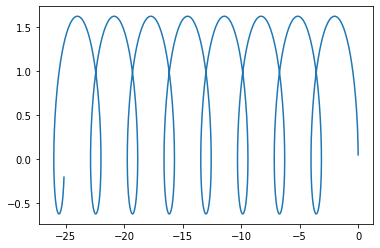

In [21]:
plt.plot(positions[:, 2], positions[:, 1])

## Наконец, самое сложное, рассмотрим движение частицы в непостоянном электромагнитным полем с $\vec{E}\ne const$, $\vec{B}=const$.

In [31]:
# поле Е
def e_of_x(x):
    return 10*np.sign(np.sin(np.pi * 100*x / 25))

In [32]:
# вычисляем траекторию одной частицы
def compute_trajectory(m, q):
    r = ode(newton).set_integrator('dopri5')
    r.set_initial_value(initial_conditions, t0).set_f_params(m, q, 10.0, 10.)
    positions = []
    t1 = 200
    dt = 0.05
    while r.successful() and r.t < t1:
        r.set_f_params(m, q, 1.0, e_of_x(r.y[0]))
        r.integrate(r.t+dt)
        positions.append(r.y[:3])

    return np.array(positions)

In [33]:
positions = []
for m, q in zip([1, 0.1, 1, 0.1], [1, 1, -1, -1]): # задаем массу и заряд частиц
    positions.append(compute_trajectory(m, q))

Text(0.5, 0, 'z')

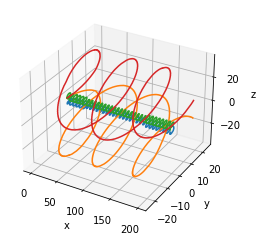

In [34]:
from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
for position in positions:
    ax.plot3D(position[:, 0], position[:, 1], position[:, 2])
plt.xlabel('x')
plt.ylabel('y')
ax.set_zlabel('z')

Теперь сделаем анимацию движения.

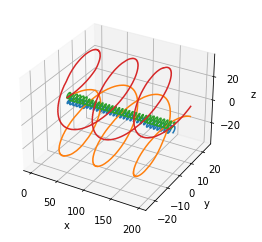

In [35]:
FRAMES = 100
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

def init():
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    ax.set_zlabel('z')
    
# реализуем анимацию
def animate(i):
    current_index = int(positions[0].shape[0] / FRAMES * i)
    ax.cla()
    for position in positions:
        ax.plot(position[:current_index, 0], 
                  position[:current_index, 1], 
                  position[:current_index, 2])
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    ax.set_zlabel('z')
# вызываем функцию анимации 
anim = animation.FuncAnimation(fig, animate, init_func=init,
                               frames=FRAMES, interval=100)

# вызываем новую функцию, чтобы вывести результат
HTML(anim.to_jshtml())